In [ ]:
# downloading data
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 21.01 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
import os
import numpy as np
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import pandas as pd
from imgaug import augmenters as iaa
import random
import ntpath
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [ ]:
# Directory containing the data
data_directory = 'track'

# Column headers for the CSV file
column_headers = ['cam_center', 'cam_left', 'cam_right', 'steering_angle', 'throttle_input', 'reverse_gear', 'vehicle_speed']

# Load the CSV file into a DataFrame
driving_data = pd.read_csv(os.path.join(data_directory, 'driving_log.csv'), names=column_headers)

# Configure pandas to display unlimited column width for better visualization
pd.set_option('display.max_colwidth', None)

# Display the first few rows of the DataFrame
driving_data.head()


,cam_center,cam_left,cam_right,steering_angle,throttle_input,reverse_gear,vehicle_speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
def extract_filename(filepath):
    _, filename = ntpath.split(filepath)
    return filename

# Apply the function to extract file names from the paths
driving_data['cam_center'] = driving_data['cam_center'].apply(extract_filename)
driving_data['cam_left'] = driving_data['cam_left'].apply(extract_filename)
driving_data['cam_right'] = driving_data['cam_right'].apply(extract_filename)

# Display the updated DataFrame
driving_data.head()


,cam_center,cam_left,cam_right,steering_angle,throttle_input,reverse_gear,vehicle_speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


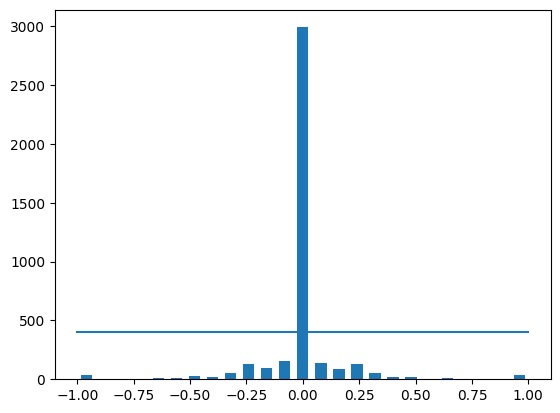

In [ ]:
# Define the number of bins for the histogram
num_bins = 25
# Define the maximum number of samples to keep per bin
samples_per_bin = 400
# Compute the histogram for the steering angle data
hist, bins = np.histogram(driving_data['steering_angle'], num_bins)
# Compute the center of each bin for plotting
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)

# Plot a horizontal line indicating the maximum number of samples allowed per bin
plt.plot(
    (np.min(driving_data['steering_angle']), np.max(driving_data['steering_angle'])),
    (samples_per_bin, samples_per_bin)
)



In [ ]:
# Display the total number of entries in the dataset
print('Total records:', len(driving_data))

# Print the shape of the dataset (rows and columns)
print('Dataset dimensions:', driving_data.shape)


Total records: 4053
Dataset dimensions: (4053, 7)


In [ ]:
indices_to_remove = []

# Iterate over bins to determine indices to remove
for bin_idx in range(num_bins):
    indices_in_bin = [
        idx for idx, steer in enumerate(driving_data['steering_angle'])
        if bins[bin_idx] <= steer <= bins[bin_idx + 1]
    ]

    # Shuffle the indices and select the excess samples
    indices_in_bin = shuffle(indices_in_bin)
    excess_indices = indices_in_bin[samples_per_bin:]

    # Collect indices to be removed
    indices_to_remove.extend(excess_indices)

# Log the number of removed entries
print('Number of entries removed:', len(indices_to_remove))

# Drop the rows with indices in the removal list
driving_data.drop(index=indices_to_remove, inplace=True)

# Log the remaining number of entries
print('Number of entries remaining:', len(driving_data))


Number of entries removed: 2590
Number of entries remaining: 1463


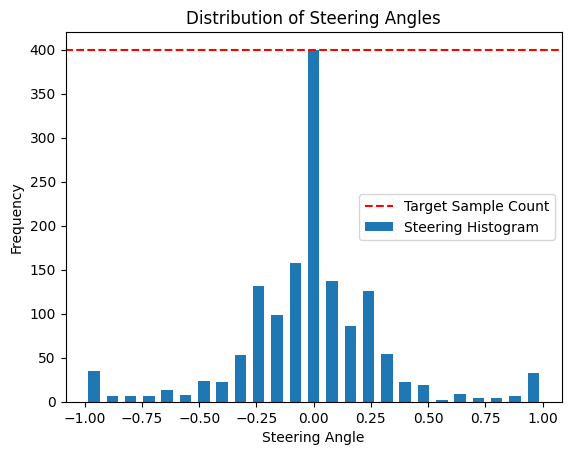

In [ ]:
# Generate a histogram for the steering angle data
steering_hist, bin_edges = np.histogram(driving_data['steering_angle'], bins=num_bins)

# Compute the midpoints of each bin for visualization
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Create a bar chart to display the histogram
plt.bar(bin_centers, steering_hist, width=0.05, label='Steering Histogram')

# Draw a horizontal line to represent the target number of samples per bin
plt.axhline(
    y=samples_per_bin,
    xmin=np.min(driving_data['steering_angle']),
    xmax=np.max(driving_data['steering_angle']),
    color='red',
    linestyle='--',
    linewidth=1.5,
    label='Target Sample Count',
)

# Add labels and legend for clarity
plt.xlabel('Steering Angle')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Steering Angles')
plt.show()


In [ ]:
import os
import numpy as np

def prepare_image_and_steering(data_folder, records):
    img_paths, steer_values = [], []

#   Helper function to add image path and adjusted steering angle
    def append_image_and_steering(img_name, adjustment):

        img_paths.append(os.path.join(data_folder, img_name.strip()))
        steer_values.append(current_steering + adjustment)

    # Process each record in the DataFrame
    for _, row in records.iterrows():
        current_steering = float(row['steering_angle'])

        # Append center image
        append_image_and_steering(row['cam_center'], 0.0)

        # Append left image with positive adjustment
        append_image_and_steering(row['cam_left'], 0.15)

        # Append right image with negative adjustment
        append_image_and_steering(row['cam_right'], -0.15)

    return np.array(img_paths), np.array(steer_values)



In [ ]:
# Load image paths and steering angles using the new function
images_directory = os.path.join(data_directory, 'IMG')
img_paths, steering_angles = prepare_image_and_steering(images_directory, driving_data)


In [ ]:
# Display the first 10 image paths
print("First 10 image paths:")
print(img_paths[:10])


First 10 image paths:
['track/IMG/center_2018_07_16_17_11_44_413.jpg'
 'track/IMG/left_2018_07_16_17_11_44_413.jpg'
 'track/IMG/right_2018_07_16_17_11_44_413.jpg'
 'track/IMG/center_2018_07_16_17_11_44_485.jpg'
 'track/IMG/left_2018_07_16_17_11_44_485.jpg'
 'track/IMG/right_2018_07_16_17_11_44_485.jpg'
 'track/IMG/center_2018_07_16_17_11_44_558.jpg'
 'track/IMG/left_2018_07_16_17_11_44_558.jpg'
 'track/IMG/right_2018_07_16_17_11_44_558.jpg'
 'track/IMG/center_2018_07_16_17_11_44_627.jpg']


In [ ]:
# Total number of image paths
print("Total number of image paths:", len(img_paths))


Total number of image paths: 4389


In [ ]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and validation subsets
train_images, valid_images, train_steering, valid_steering = train_test_split(
    img_paths, steering_angles, test_size=0.2, random_state=6
)

# Display the count of training and validation samples
print(f"Number of training samples: {len(train_images)}")
print(f"Number of validation samples: {len(valid_images)}")


Number of training samples: 3511
Number of validation samples: 878


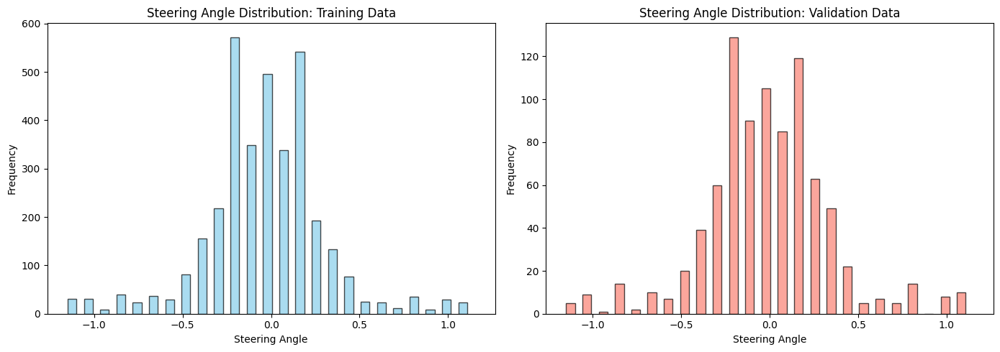

In [ ]:
# Configure the plot dimensions
plt.figure(figsize=(14, 5))

# Histogram for the training set
plt.subplot(1, 2, 1)
plt.hist(train_steering, bins=num_bins, width=0.05, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Steering Angle Distribution: Training Data', fontsize=12)
plt.xlabel('Steering Angle', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

# Histogram for the validation set
plt.subplot(1, 2, 2)
plt.hist(valid_steering, bins=num_bins, width=0.05, color='salmon', edgecolor='black', alpha=0.7)
plt.title('Steering Angle Distribution: Validation Data', fontsize=12)
plt.xlabel('Steering Angle', fontsize=10)
plt.ylabel('Frequency', fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


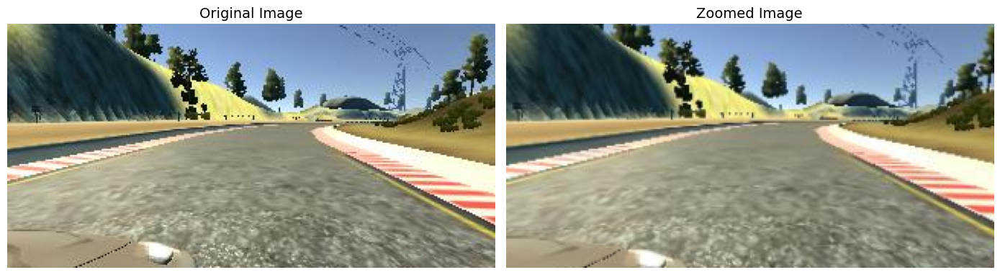

In [ ]:
# Define a function to perform zoom augmentation
def apply_zoom(img):
    zoom_transform = iaa.Affine(scale=(1.0, 1.3))  # Specify the zoom range
    augmented_img = zoom_transform.augment_image(img)  # Apply the transformation
    return augmented_img

# Randomly pick an image from the list of image paths
random_index = random.randint(0, len(img_paths) - 1)
selected_image_path = img_paths[random_index]

# Load the chosen image
loaded_image = mpimg.imread(selected_image_path)

# Perform zoom augmentation on the loaded image
zoomed_result = apply_zoom(loaded_image)

# Create a side-by-side visualization for comparison
plt.figure(figsize=(14, 6))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(loaded_image)
plt.title('Original Image', fontsize=14)
plt.axis('off')

# Plot the zoomed image
plt.subplot(1, 2, 2)
plt.imshow(zoomed_result)
plt.title('Zoomed Image', fontsize=14)
plt.axis('off')

# Optimize layout and display the plots
plt.tight_layout()
plt.show()


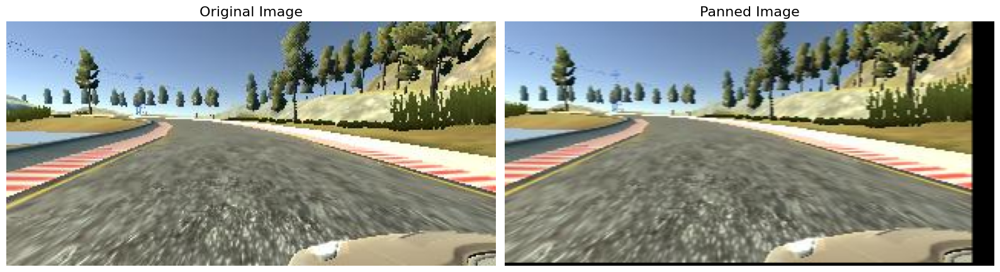

In [ ]:
# Define a function for image panning (translation)
def apply_pan(img):
    translation = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})  # Define translation range
    translated_img = translation.augment_image(img)  # Perform the translation
    return translated_img

# Randomly pick an image path from the dataset
random_image_index = random.randint(0, len(img_paths) - 1)
chosen_image_path = img_paths[random_image_index]

# Load the chosen image
loaded_img = mpimg.imread(chosen_image_path)

# Apply panning to the image
translated_img = apply_pan(loaded_img)

# Set up a visualization with two plots
plt.figure(figsize=(16, 8))

# Display the original image
plt.subplot(1, 2, 1)
plt.imshow(loaded_img)
plt.title("Original Image", fontsize=16)
plt.axis("off")

# Display the panned image
plt.subplot(1, 2, 2)
plt.imshow(translated_img)
plt.title("Panned Image", fontsize=16)
plt.axis("off")

# Adjust layout for better visual spacing and render the plots
plt.tight_layout()
plt.show()


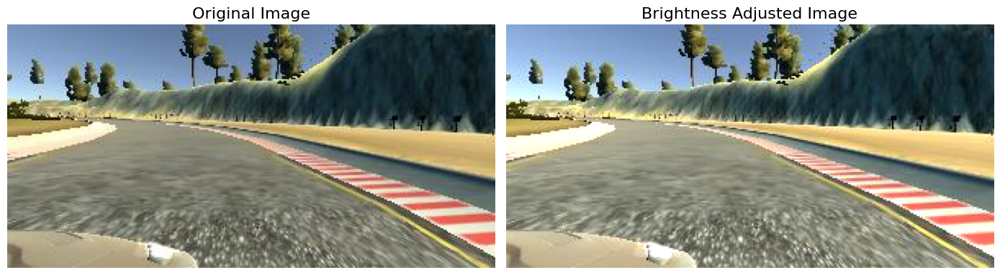

In [ ]:
# Function to apply random brightness adjustments to an image
def adjust_brightness_randomly(img):
    brightness_adjustment = iaa.Multiply((0.2, 1.2))
    adjusted_img = brightness_adjustment.augment_image(img)
    return adjusted_img

# Randomly pick an image path from the list
random_index = random.randint(0, len(img_paths) - 1)
selected_img_path = img_paths[random_index]

# Load the chosen image
loaded_image = mpimg.imread(selected_img_path)

# Perform random brightness adjustment
brightness_adjusted_img = adjust_brightness_randomly(loaded_image)

# Set up the figure and subplots for visualization
plt.figure(figsize=(14, 7))

# Display the original image
plt.subplot(1, 2, 1)
plt.imshow(loaded_image)
plt.title("Original Image", fontsize=16)
plt.axis("off")

# Display the image with adjusted brightness
plt.subplot(1, 2, 2)
plt.imshow(brightness_adjusted_img)
plt.title("Brightness Adjusted Image", fontsize=16)
plt.axis("off")

# Optimize layout and render the plots
plt.tight_layout()
plt.show()


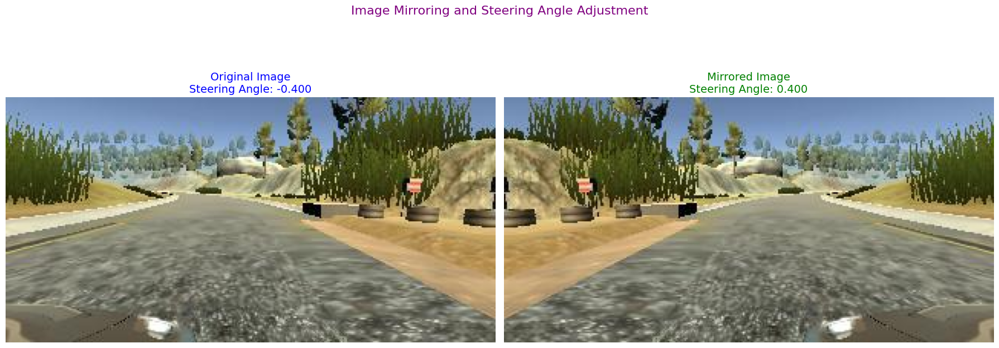

In [ ]:
# Function to mirror the image and recalculate the steering angle
def mirror_image_and_steering(img, angle):
    mirrored_img = cv2.flip(img, 1)
    mirrored_angle = -angle
    return mirrored_img, mirrored_angle

# Randomly choose an image and corresponding steering angle
selected_index = random.randint(0, len(img_paths) - 1)
selected_image_path = img_paths[selected_index]
corresponding_angle = steering_angles[selected_index]

# Load the randomly selected image
input_image = mpimg.imread(selected_image_path)



# Apply mirroring and get the updated image and angle
mirrored_image, mirrored_angle = mirror_image_and_steering(input_image, corresponding_angle)

# Setup visualization
plt.figure(figsize=(18, 8))

# Display the original image and angle
plt.subplot(121)
plt.imshow(input_image)
plt.title(f"Original Image\nSteering Angle: {corresponding_angle:.3f}", fontsize=14, color="blue")
plt.axis("off")

# Display the mirrored image and angle
plt.subplot(122)
plt.imshow(mirrored_image)
plt.title(f"Mirrored Image\nSteering Angle: {mirrored_angle:.3f}", fontsize=14, color="green")
plt.axis("off")

# Show a customized layout and render the plots
plt.tight_layout()
plt.suptitle("Image Mirroring and Steering Angle Adjustment", fontsize=16, color="purple")
plt.show()


In [ ]:
# Apply random augmentations: panning, zooming, brightness adjustment, and flipping. Each augmentation has a 50% chance of being applied.
def apply_random_augmentations(img_path, angle):

    # Load the image from the provided path
    img = mpimg.imread(img_path)

    # Apply panning augmentation with a 50% probability
    if np.random.rand() < 0.5:
        img = apply_pan(img)  # Updated to use apply_pan

    # Apply zoom augmentation with a 50% probability
    if np.random.rand() < 0.5:
        img = apply_zoom(img)

    # Apply brightness adjustment with a 50% probability
    if np.random.rand() < 0.5:
        img = adjust_brightness_randomly(img)

    # Apply horizontal flip with a 50% probability
    if np.random.rand() < 0.5:
        img, angle = mirror_image_and_steering(img, angle)

    return img, angle





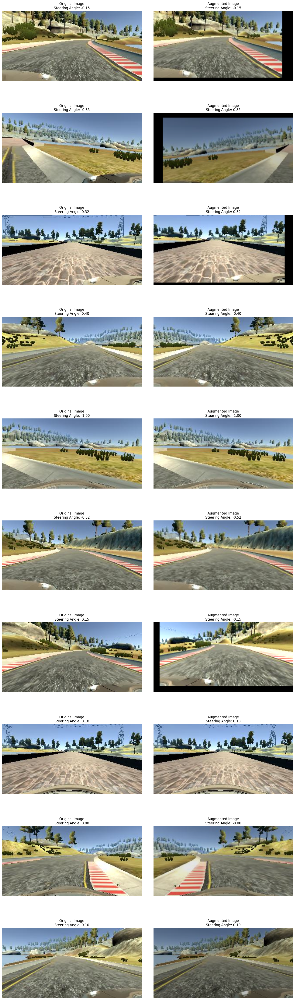

In [ ]:
# Set up the grid dimensions
ncol = 2  # Two columns: Original image and Augmented image
nrow = 10  # Number of image pairs to display

# Create a figure with nrow x ncol subplots
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))

# Ensure the layout is tight (no overlapping between subplots)
fig.tight_layout()

# Loop through the grid to display original and augmented images
for i in range(nrow):
    # Randomly pick an image and its steering angle
    randnum = random.randint(0, len(img_paths) - 1)
    random_image = img_paths[randnum]
    random_steering = steering_angles[randnum]

    # Load the original image
    original_image = mpimg.imread(random_image)

    # Apply random augmentations
    augmented_image, steering = apply_random_augmentations(random_image, random_steering)

    # Display the original image in the left column
    axs[i][0].imshow(original_image)
    axs[i][0].set_title(f"Original Image\nSteering Angle: {random_steering:.2f}")
    axs[i][0].axis("off")  # Hide axes for cleaner display

    # Display the augmented image in the right column
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title(f"Augmented Image\nSteering Angle: {steering:.2f}")
    axs[i][1].axis("off")  # Hide axes for cleaner display

# Render the plot
plt.show()



In [ ]:
def preprocess_image(image):
    """
    Preprocess the input image by cropping, resizing, converting color space,
    applying blur, and normalizing.
    """
    # Remove the top and bottom sections of the image
    cropped_img = image[60:135, :, :]

    # Change the color space from RGB to YUV
    yuv_img = cv2.cvtColor(cropped_img, cv2.COLOR_RGB2YUV)

    # Smooth the image using a Gaussian filter
    blurred_img = cv2.GaussianBlur(yuv_img, (3, 3), sigmaX=0)

    # Scale the image to 200x66 resolution
    resized_img = cv2.resize(blurred_img, (200, 66), interpolation=cv2.INTER_AREA)

    # Normalize pixel values to the range [0, 1]
    normalized_img = resized_img.astype('float32') / 255.0

    return normalized_img


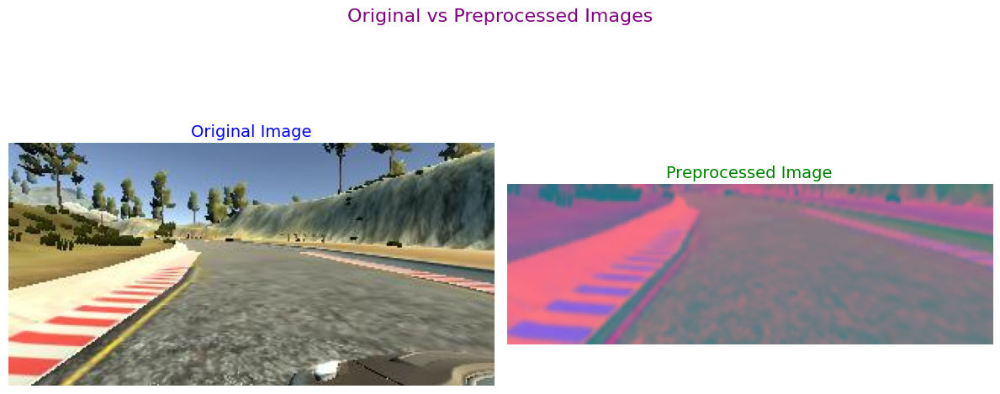

In [ ]:
# Select an image from the dataset
image_path = img_paths[100]  # Assuming image_paths contains the list of image file paths

# Load the original image
original_img = mpimg.imread(image_path)

# Preprocess the image
processed_img = preprocess_image(original_img)  # Assuming preprocess_image is defined

# Setup the figure for visualization
plt.figure(figsize=(12, 6))

# Plot the original image
plt.subplot(1, 2, 1)
plt.imshow(original_img)
plt.title("Original Image", fontsize=14, color="blue")
plt.axis("off")

# Plot the preprocessed image
plt.subplot(1, 2, 2)
plt.imshow(processed_img)
plt.title("Preprocessed Image", fontsize=14, color="green")
plt.axis("off")

# Add a main title for the visualization
plt.suptitle("Original vs Preprocessed Images", fontsize=16, color="purple")

# Display the figure
plt.tight_layout()
plt.show()


In [ ]:
import random
import numpy as np
import matplotlib.image as mpimg

def generate_batches(img_paths, steering_angles, batch_size, training_mode):
    """
    Generate batches of preprocessed images and steering angles for training or validation.
    """
    while True:
        # Preallocate arrays for the batch
        image_batch = np.zeros((batch_size, 66, 200, 3), dtype=np.float32)  # Predefined image shape after preprocessing
        steering_batch = np.zeros(batch_size, dtype=np.float32)

        # Populate the batch
        for batch_idx in range(batch_size):
            # Randomly select an index
            index = random.choice(range(len(img_paths)))

            if training_mode:
                # Apply random augmentations if training
                augmented_img, adjusted_steering = apply_random_augmentations(img_paths[index], steering_angles[index])
            else:
                # Directly load the image for validation
                raw_img = mpimg.imread(img_paths[index])
                adjusted_steering = steering_angles[index]

            # Preprocess the image (cropping, resizing, normalization, etc.)
            processed_img = preprocess_image(augmented_img if training_mode else raw_img)

            # Add the image and steering angle to the batch
            image_batch[batch_idx] = processed_img
            steering_batch[batch_idx] = adjusted_steering

        # Yield the batch as NumPy arrays
        yield image_batch, steering_batch



In [ ]:
# Fetch one batch from the training generator
train_gen = generate_batches(train_images, train_steering, batch_size=1, training_mode=True)
x_train_gen, y_train_gen = next(train_gen)

# Fetch one batch from the validation generator
valid_gen = generate_batches(valid_images, valid_steering, batch_size=1, training_mode=False)
x_valid_gen, y_valid_gen = next(valid_gen)


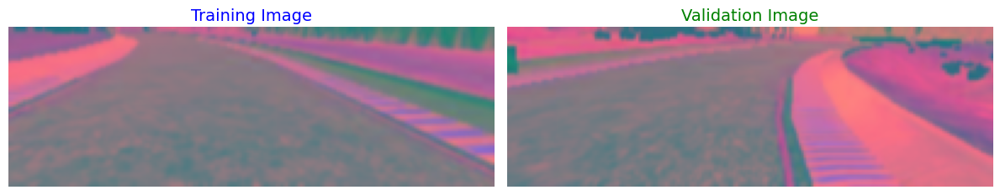

In [ ]:
# Assuming x_train_gen and x_valid_gen are batches fetched from the generator
# For example: x_train_gen, y_train_gen = next(train_gen)

# Create a figure with 2 subplots: one for the training image and one for the validation image
plt.figure(figsize=(12, 6))

# Display the first image from the training batch
plt.subplot(1, 2, 1)
plt.imshow(x_train_gen[0])  # Index 0 for the first image in the training batch
plt.title("Training Image", fontsize=14, color="blue")
plt.axis("off")  # Remove axes for cleaner visualization

# Display the first image from the validation batch
plt.subplot(1, 2, 2)
plt.imshow(x_valid_gen[0])  # Index 0 for the first image in the validation batch
plt.title("Validation Image", fontsize=14, color="green")
plt.axis("off")  # Remove axes for cleaner visualization

# Adjust layout for better spacing
plt.tight_layout()

# Render the plot
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

def build_nvidia_model():
    """
    Builds the NVIDIA deep learning model for end-to-end autonomous driving.
    """
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu', name="Conv2D_24"))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu', name="Conv2D_36"))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu', name="Conv2D_48"))
    model.add(Conv2D(64, (5, 5), activation='elu', name="Conv2D_64"))

    # Fully connected layers
    model.add(Flatten(name="Flatten"))
    model.add(Dense(100, activation='elu', name="Dense_100"))
    model.add(Dense(50, activation='elu', name="Dense_50"))
    model.add(Dense(10, activation='elu', name="Dense_10"))

    # Output layer for regression (steering angle prediction)
    model.add(Dense(1, name="Output"))

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

    return model

# Build and summarize the NVIDIA model
nvidia_model = build_nvidia_model()
nvidia_model.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Conv2D_24 (Conv2D)                   │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv2D_36 (Conv2D)                   │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv2D_48 (Conv2D)                   │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Conv2D_64 (Conv2D)                   │ (None, 1, 18, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense_100 (Dense)                    │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense_50 (Dense)                     │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Dense_10 (Dense)                     │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output (Dense)                       │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = nvidia_model.fit(
    generate_batches(train_images, train_steering, batch_size=100, training_mode=True),
    steps_per_epoch=300,
    epochs=10,
    validation_data=generate_batches(valid_images, valid_steering, batch_size=100, training_mode=False),
    validation_steps=200,
    verbose=1,
    shuffle=True
)


Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 332s 1s/step - loss: 0.3569 - val_loss: 0.0718
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 331s 1s/step - loss: 0.0946 - val_loss: 0.0569
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 328s 1s/step - loss: 0.0705 - val_loss: 0.0516
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 326s 1s/step - loss: 0.0603 - val_loss: 0.0466
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 326s 1s/step - loss: 0.0531 - val_loss: 0.0372
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 328s 1s/step - loss: 0.0487 - val_loss: 0.0355
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 331s 1s/step - loss: 0.0455 - val_loss: 0.0314
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 318s 1s/step - loss: 0.0451 - val_loss: 0.0340
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 318s 1s/step - loss: 0.0433 - val_loss: 0.0291
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 316s 1s/step - loss: 0.0413 - val_loss: 0.0290


In [ ]:
# Save the trained model to a file
nvidia_model.save('udacity_model.h5')
print("Model saved as 'udacity_model.h5'")



Model saved as 'udacity_model.h5'


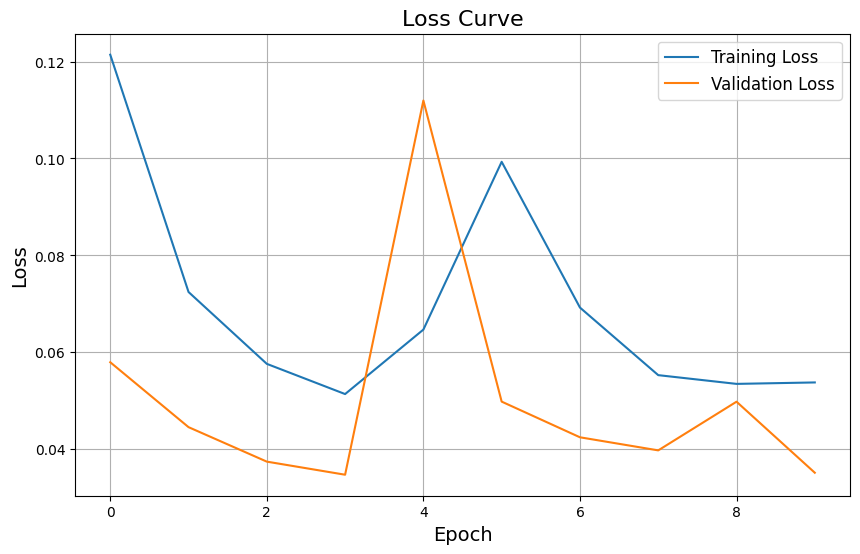

In [35]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

# Add labels, title, and legend
plt.title('Loss Curve', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

# Show the plot
plt.show()


In [36]:
from google.colab import files

# Download the saved model
files.download('udacity_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>